In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls

drive  sample_data


In [ ]:
import numpy as np
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import random
from tqdm import tqdm
#from image_processing import processing

In [ ]:
from keras.optimizers import Adam
from keras.applications.resnet50 import ResNet50
from keras.layers import Dense, Flatten,Input, Convolution2D, Dropout, LSTM, TimeDistributed, Embedding, Bidirectional, Activation,BatchNormalization, RepeatVector,Concatenate
from keras.models import Sequential, Model
from keras.utils import np_utils
from keras.preprocessing import image, sequence

In [ ]:
# Load data
images_dir = os.listdir("/content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data")
images_path = '/content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/'
captions_path = '/content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Flickr_TextData/Flickr8k.token.txt'
train_path = '/content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.trainImages.txt'

_path = '/content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.devImages.txt'
test_path = '/content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Flickr_TextData/Flickr_8k.testImages.txt'

captions = open(captions_path, 'r').read().split("\n")
x_train = open(train_path, 'r').read().split("\n")
x_val = open(val_path, 'r').read().split("\n")
x_test = open(test_path, 'r').read().split("\n")

In [ ]:
(len(captions)-1)

40460

In [ ]:
k=captions[random.randrange(0,40460)].split('#')
print(k)
k[1][2:]

['281419391_522557ce27.jpg', '3\tRace car smoking very badly on the racetrack .']


'Race car smoking very badly on the racetrack .'

In [ ]:
#Loading key-value pairs as image-caption 

caption = {}

for i in range(len(captions)-1):
    print(captions[i].split("#"))
    try:
        photo, cap  = captions[i].split("#")
        cap_ = '<start> '+ cap[2:] + ' <end>'
    except:
        pass
    if photo in caption:
        caption[photo].append(cap_)
    else:
        caption[photo] = [cap_]


Streaming output truncated to the last 5000 lines.
['378453580_21d688748e.jpg', '0\tA dog is jumping over a log in a wooded area while carrying another log .']
['378453580_21d688748e.jpg', '1\tA dog with a stick in his mouth jumps over a fallen tree in the forest .']
['378453580_21d688748e.jpg', '2\tDog carries stick and jumps over a log .']
['378453580_21d688748e.jpg', '3\tThe dog carries a stick and jumps over a log in the woods .']
['378453580_21d688748e.jpg', '4\tThe dog jumps over the log with a stick in its mouth .']
['379006645_b9a2886b51.jpg', '0\tA black and brown dog is running between two cement barriers with snow .']
['379006645_b9a2886b51.jpg', '1\ta dog runs down the cold aisle .']
['379006645_b9a2886b51.jpg', '2\tBlack and tan small dog walking with perked ears .']
['379006645_b9a2886b51.jpg', '3\tThe black and brown dog walks toward the camera , in an enclosed , snowy area .']
['379006645_b9a2886b51.jpg', '4\tThe brown and black dog is running through a snowy street .']

['2987096101_a41896187a.jpg', '3\tA woman stands at the edge of a cliff overlooking the mountains .']


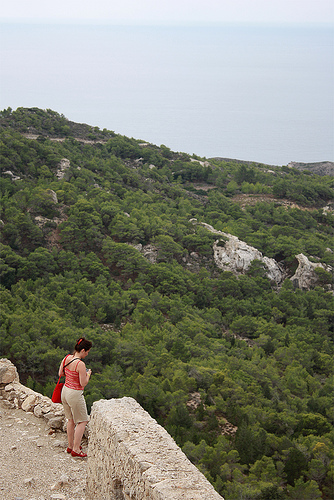

<start> A woman holding a purse stands at the edge of a rocky ledge and looks out at the trees . <end>
<start> A woman in a pink shirt and khaki shorts looks over a crumbling rock face overlooking a large forested area . <end>
<start> A woman in a red shirt stands on a monument above a forest . <end>
<start> A woman stands at the edge of a cliff overlooking the mountains . <end>
<start> A woman stands next to a big , green hill . <end>


In [ ]:
#Displaying a random Image along with its captions
k=captions[random.randrange(0,40460)].split('#')
print(k)
from IPython.display import Image , display
z=Image(filename=images_path+k[0])
display(z)
for i  in caption[k[0]] :
    print(i)

In [ ]:
print(len(caption))
len(x_train)

8092


6001

In [ ]:
capt = list(caption.keys())


In [ ]:
def gen_dataset(dataset,caption,train):
  for img in train:
        if img == '':
            continue
        for capt in caption[img]:
            dataset.write((img+"\t"+capt+"\n").encode())
            dataset.flush()
  dataset.close()

In [ ]:
train_dataset = open('flickr_8k_train_dataset.txt','wb')
train_dataset.write(b"image_id\tcaptions\n")

val_dataset = open('flickr_8k_val_dataset.txt','wb')
val_dataset.write(b"image_id\tcaptions\n")

test_dataset = open('flickr_8k_test_dataset.txt','wb')
test_dataset.write(b"image_id\tcaptions\n")

18

In [ ]:
gen_dataset(train_dataset,caption,x_train)
gen_dataset(test_dataset,caption,x_test)
gen_dataset(val_dataset,caption,x_val)

In [ ]:
train_dataset = open('flickr_8k_train_dataset.txt','rb')
print(len(train_dataset.readlines()))

30000


In [ ]:
res_model=ResNet50(include_top=False,weights='imagenet',pooling='avg',input_shape=(224,224,3))

94773248/94765736 [==============================] - 0s 0us/step


In [ ]:
import numpy as np
from PIL import Image as pilimage
from keras.applications.vgg16 import VGG16
from keras.models import  Model
def processing(image_name,model = None,get_histogram = False,size = None,convert_BGR = True,image_path = images_path, mean_of_data = [104,117,124], return_arr = False):
       
        
    '''
    Subtracting the dataset mean serves to "center" the data. Additionally, you ideally would like to divide by the stddev of that
    feature or pixel as well if you want to normalize each feature value to a z-score. 
    
    PARAMETER:
    image_name --> name of the image
    model --> if you want to extract features then give the model
    get_histogram --> Boolean for displaying histogram
    size --> tuple in the form of (width,height)
    convert_BGR--> convert to BGR Boolean type
    mean)of_data --> to normalize the data in order of the channel
    
    RETURN:
    pred_value if model given.A column array.
    im_arr image array
    '''
    if model == None:
        
        base_model = VGG16(weights='imagenet', include_top=True, input_shape=(224,224,3))
        model = Model(base_model.input, base_model.layers[-2].output)
        
    path = image_path + str(image_name)
    with pilimage.open(path) as image:
        if not(size == None):
            image = image.resize(size)
        im_arr = np.fromstring(image.tobytes(), dtype=np.uint8)
        im_arr = im_arr.reshape((image.size[1], image.size[0], 3))
        im_arr = np.expand_dims(im_arr, axis=0)
    
    
    
    if get_histogram == True:
        print(image.histogram())

    if convert_BGR == True:
        im_arr = im_arr[ :,:, :, ::-1]
    if not(mean_of_data == None):
        im_arr[ :,:, :, 0] -= mean_of_data[0]
        im_arr[ :,:, :, 1] -= mean_of_data[1]
        im_arr[ :,: ,:, 2] -= mean_of_data[2]
        
    if not(model == None):    
        pred = model.predict(im_arr)
        pred = np.reshape(pred, pred.shape[1])
        if return_arr == False:
            return pred
        if return_arr == True:
            return pred, im_arr
    
    return im_arr

In [ ]:
train_data = {}

temp=0
for i in x_train:
    # try:
      images_path=images_path
      #print(images_path)
      path = images_path + i
      # print(path)
      print(temp," : ",path)
      train_data[i]  = processing(i,size = (224,224),convert_BGR=False,model = res_model
                      ,mean_of_data=[0,0,0],return_arr=False,image_path= images_path) # local module
      temp = temp + 1
    # except:
    #     pass

0  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/2513260012_03d33305cf.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


Streaming output truncated to the last 5000 lines.
1001  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/3487261028_30791528ec.jpg
1002  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/3136043366_b3f8607a0e.jpg
1003  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/3475005101_6f6e437459.jpg
1004  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/3472270112_0a7cb7b27c.jpg
1005  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/2868668723_0741222b23.jpg
1006  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/3500342526_393c739e2f.jpg
1007  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/542405691_0594b1ce72.jpg
1008  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Data/Flickr_Data/Images/421153376_d1d325568f.jpg
1009  :  /content/drive/MyDrive/Flikr_Dataset/archive/Flickr_Da

IsADirectoryError: ignored

In [ ]:
'''
train_data = {}

temp=0
for i in tqdm(x_train):
    # try:
      path = images_path + i
      print(temp," : ",path)
      train_data[i]  = processing(i,size = (224,224),convert_BGR=False,model = res_model
                      ,mean_of_data=[0,0,0],return_arr=False,image_path= images_path) # local module
      temp = temp + 1
    # except:
        # pass
'''
train_data

{'2513260012_03d33305cf.jpg': array([0.46200788, 1.291976  , 0.3588317 , ..., 0.42597818, 0.        ,
        0.32915807], dtype=float32),
 '2903617548_d3e38d7f88.jpg': array([0.01809733, 0.1838199 , 0.0680138 , ..., 0.02944385, 0.1594689 ,
        0.38959524], dtype=float32),
 '3338291921_fe7ae0c8f8.jpg': array([1.2228065 , 1.6688445 , 0.        , ..., 0.        , 0.33315378,
        0.03227137], dtype=float32),
 '488416045_1c6d903fe0.jpg': array([0.6049611 , 0.7736534 , 0.17205854, ..., 0.22330979, 0.5756089 ,
        0.4744989 ], dtype=float32),
 '2644326817_8f45080b87.jpg': array([0.29901895, 1.1705563 , 0.02386489, ..., 0.        , 1.4641532 ,
        0.06760751], dtype=float32),
 '218342358_1755a9cce1.jpg': array([0.37287688, 0.32014537, 0.68877536, ..., 0.3678916 , 0.12351731,
        0.00469216], dtype=float32),
 '2501968935_02f2cd8079.jpg': array([0.80514884, 1.7292356 , 0.05379478, ..., 0.07036757, 0.44926453,
        0.5314027 ], dtype=float32),
 '2699342860_5288e203ea.jpg':

In [ ]:
with open( "./train_encoded_images.p", "wb" ) as pickle_f:
    pickle.dump(train_data, pickle_f )

In [ ]:
ds = pd.read_csv("flickr_8k_train_dataset.txt", delimiter='\t').values

print(ds.shape)

(29999, 2)


In [ ]:
ds[0:5]

array([['2513260012_03d33305cf.jpg',
        '<start> A black dog is running after a white dog in the snow . <end>'],
       ['2513260012_03d33305cf.jpg',
        '<start> Black dog chasing brown dog through snow <end>'],
       ['2513260012_03d33305cf.jpg',
        '<start> Two dogs chase each other across the snowy ground . <end>'],
       ['2513260012_03d33305cf.jpg',
        '<start> Two dogs play together in the snow . <end>'],
       ['2513260012_03d33305cf.jpg',
        '<start> Two dogs running through a low lying body of water . <end>']],
      dtype=object)

In [ ]:
all_caption=[]
for i in range(ds.shape[0]):
    all_caption.append(ds[i, 1])
    
print(len(all_caption))

29999


In [ ]:
words = [i.split() for i in all_caption]

In [ ]:
vocabulary = []
for i in words:
    vocabulary.extend(i)
vocabulary = list(set(vocabulary))

print(len(vocabulary))

vocab_size = len(vocabulary) +1
vocab_size

8253


8254

In [ ]:
word_in = {val:index+1 for index, val in enumerate(vocabulary)}
in_word = {str(index+1):val for index, val in enumerate(vocabulary)}

In [ ]:
max_len = 40
padded_sequences, subsequent_words = [], []
for ix in range(ds.shape[0]):
    partial_seqs = []
    next_words = []
    text = ds[ix, 1].split()
    text = [word_in[i] for i in text]
    for i in range(1, len(text)):
        partial_seqs.append(text[:i])
        next_words.append(text[i])
    
    padded_partial_seqs = sequence.pad_sequences(partial_seqs, max_len, padding='post')

    next_words_1hot = np.zeros([len(next_words), vocab_size], dtype=np.bool)
    
    #Vectorization
    for i,next_word in enumerate(next_words):
        next_words_1hot[i, next_word] = 1
        
    padded_sequences.append(padded_partial_seqs)
    subsequent_words.append(next_words_1hot)
    
padded_sequences = np.asarray(padded_sequences)
subsequent_words = np.asarray(subsequent_words)

print(padded_sequences.shape)
print(subsequent_words.shape)

(29999,)
(29999,)


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


In [ ]:
num_of_images = 2000
captions = np.zeros([0, max_len])
next_words = np.zeros([0, vocab_size])
for ix in tqdm(range(4000,4000+num_of_images)):
    captions = np.concatenate([captions, padded_sequences[ix]])
    next_words = np.concatenate([next_words, subsequent_words[ix]])
np.save("./captions.npy", captions)
np.save("./next_words.npy", next_words)
print(captions.shape)
print(next_words.shape)

100%|██████████| 2000/2000 [08:02<00:00,  4.14it/s]


(25697, 40)
(25697, 8254)


In [ ]:
image_names = []

for ix in tqdm(range(4000,6000)):
    for iy in range(padded_sequences[ix].shape[0]):
        image_names.append(ds[ix, 0])
image_names = np.asarray(image_names)

np.save("./image_names.npy", image_names)

print(len(image_names))

100%|██████████| 2000/2000 [00:00<00:00, 261718.71it/s]

25697


In [ ]:
!ls train_encoded_images.p

train_encoded_images.p


In [ ]:
with open('./train_encoded_images.p', 'rb') as f:
    encoded_images = pickle.load(f)
imgs = []

for ix in range(ds.shape[0]):
    if ds[ix, 0] in encoded_images.keys():
        imgs.append(list(encoded_images[ds[ix, 0]]))

imgs = np.asarray(imgs)
print(imgs.shape)

(29999, 2048)


In [ ]:
images = []

for ix in tqdm(range(4000,6000)):
    for iy in range(padded_sequences[ix].shape[0]):
        images.append(imgs[ix])
        
images = np.asarray(images)

np.save("images.npy", images)

print(images.shape)

100%|██████████| 2000/2000 [00:00<00:00, 136103.58it/s]


(25697, 2048)


In [ ]:
embedding_size = 128
max_len = 40



image_model = Sequential()

image_model.add(Dense(embedding_size, input_shape=(2048,), activation='relu'))
image_model.add(BatchNormalization())
image_model.add(RepeatVector(max_len))

image_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               262272    
_________________________________________________________________
batch_normalization (BatchNo (None, 128)               512       
_________________________________________________________________
repeat_vector (RepeatVector) (None, 40, 128)           0         
Total params: 262,784
Trainable params: 262,528
Non-trainable params: 256
_________________________________________________________________


In [ ]:
language_model = Sequential()

language_model.add(Embedding(input_dim=8254, output_dim=embedding_size, input_length=max_len))
language_model.add(LSTM(275, return_sequences=True))
language_model.add(TimeDistributed(Dense(embedding_size)))

language_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 40, 128)           1056512   
_________________________________________________________________
lstm (LSTM)                  (None, 40, 275)           444400    
_________________________________________________________________
time_distributed (TimeDistri (None, 40, 128)           35328     
Total params: 1,536,240
Trainable params: 1,536,240
Non-trainable params: 0
_________________________________________________________________


In [ ]:

conca = Concatenate()([image_model.output, language_model.output])
x = LSTM(150, return_sequences=True)(conca)
x = LSTM(550, return_sequences=False)(x)
x = Dense(8254)(x)
out = Activation('softmax')(x)
model = Model(inputs=[image_model.input, language_model.input], outputs = out)

model.load_weights("./model_weights1.h5")
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
dense_input (InputLayer)        [(None, 2048)]       0                                            
__________________________________________________________________________________________________
embedding_input (InputLayer)    [(None, 40)]         0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 128)          262272      dense_input[0][0]                
__________________________________________________________________________________________________
embedding (Embedding)           (None, 40, 128)      1056512     embedding_input[0][0]            
____________________________________________________________________________________________

In [ ]:
captions.shape

(25697, 40)

In [ ]:
captions=np.array(captions)


hist = model.fit([images, captions], next_words, batch_size=512, epochs=200)

Epoch 1/200
51/51 [==============================] - 11s 123ms/step - loss: 7.0953 - accuracy: 0.0578
Epoch 2/200
51/51 [==============================] - 6s 121ms/step - loss: 5.3999 - accuracy: 0.0791
Epoch 3/200
51/51 [==============================] - 6s 122ms/step - loss: 5.3570 - accuracy: 0.0727
Epoch 4/200
51/51 [==============================] - 6s 123ms/step - loss: 5.3462 - accuracy: 0.0758
Epoch 5/200
51/51 [==============================] - 6s 124ms/step - loss: 5.3133 - accuracy: 0.0752
Epoch 6/200
51/51 [==============================] - 6s 124ms/step - loss: 5.2728 - accuracy: 0.0791
Epoch 7/200
51/51 [==============================] - 6s 127ms/step - loss: 5.2776 - accuracy: 0.0766
Epoch 8/200
51/51 [==============================] - 6s 127ms/step - loss: 5.1788 - accuracy: 0.0782
Epoch 9/200
51/51 [==============================] - 7s 129ms/step - loss: 5.1557 - accuracy: 0.0802
Epoch 10/200
51/51 [==============================] - 7s 129ms/step - loss: 5.1202 - accur

In [ ]:
model.save('model_weights1.h5')

In [ ]:
def predict_captions(image):
    start_word = ["<start>"]
    while True:
        par_caps = [word_in[i] for i in start_word]
        par_caps = sequence.pad_sequences([par_caps], maxlen=max_len, padding='post')
        preds = model.predict([np.array([image]), np.array(par_caps)])
        word_pred = in_word[str(np.argmax(preds[0]))]
        start_word.append(word_pred)
        
        if word_pred == "<end>" or len(start_word) > max_len:
            break
            
    return ' '.join(start_word[1:-1])

In [ ]:
photo = os.listdir(images_path)
print(len(photo))

8091


In [ ]:
from PIL import Image as pilimage
from IPython.display import Image as ipython_img  
def get_caption(input_image):
    
    
  
    filename=images_path+input_image
    z_ = ipython_img(filename)
    display(z_)  
    pred_test = processing(input_image,size = (224,224),convert_BGR=False,model = res_model
                          ,mean_of_data=[0,0,0],return_arr=False,image_path=images_path) # local module
    Argmax_Search = predict_captions(pred_test)
    print(Argmax_Search)
    print('\n')

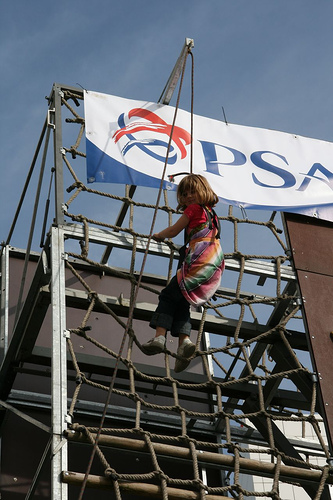

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


A band in guy playing at a car .




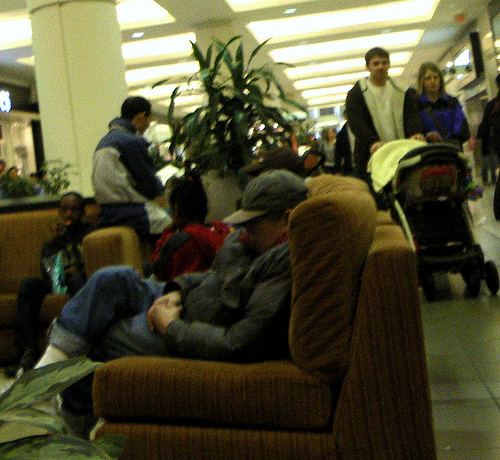

A people are are walking at a busy city while person a person city .




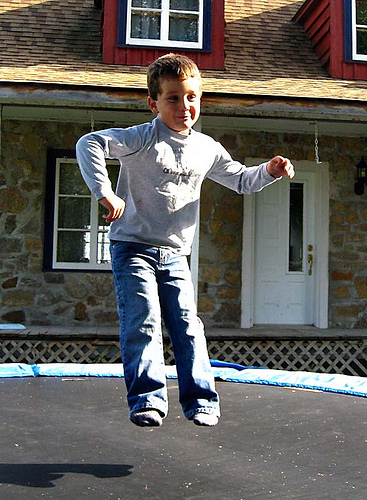

A little girl with a green and wearing a picture wearing a toddler in the park .




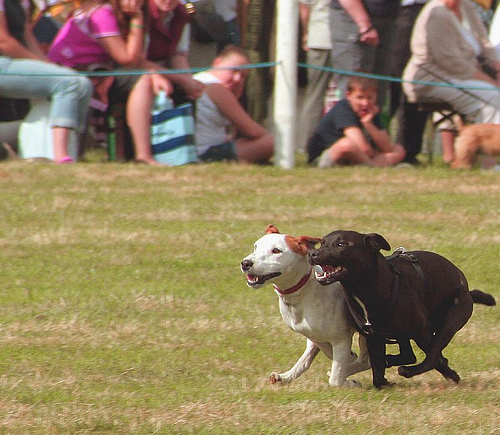

A brown and white dog is fetching a ball to catch a red ball .




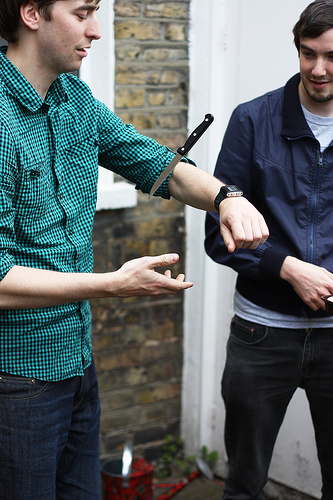

A girl in a blue shirt wearing a brown hat holding a picture .




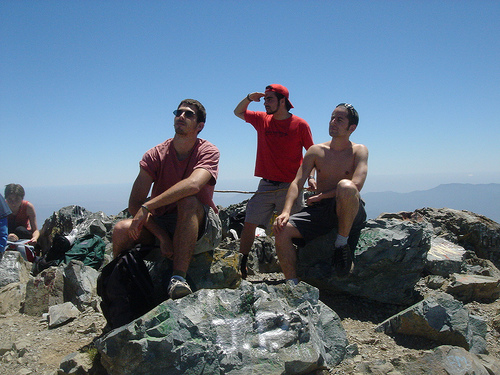

A group of men are walking on a field of people .




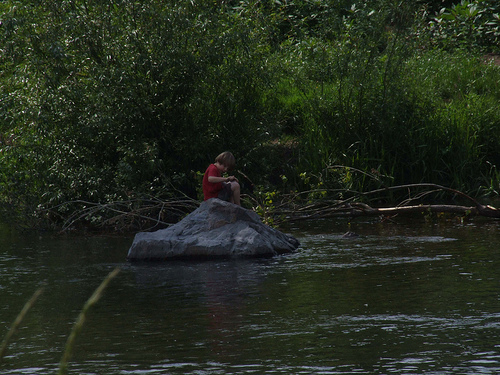

A woman in a picture on a rocky wooded wooded forest .




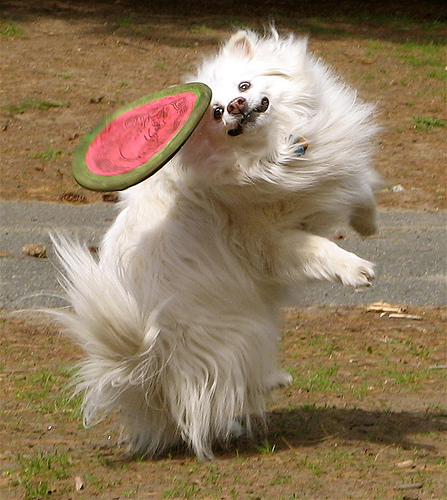

A black dog is jumping catch catching a toy while toy while toy while toy .




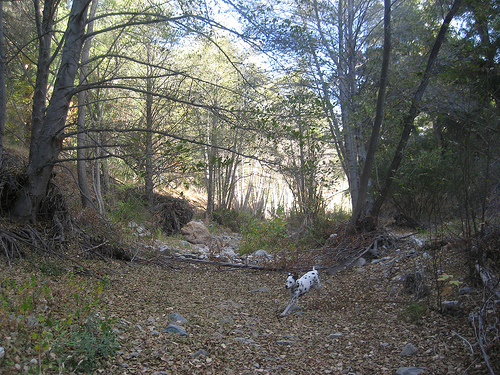

A person a rides a road .




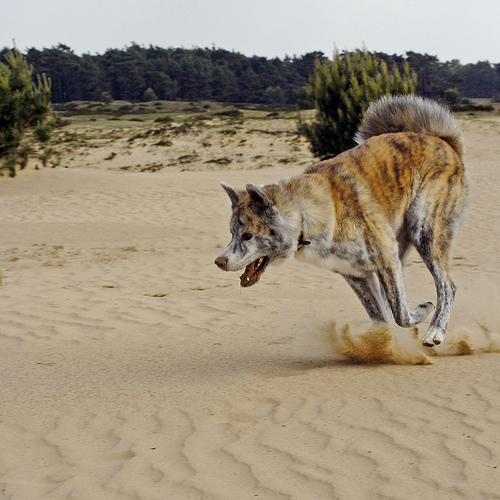

A brown dog and and a dog running in the shallows in other in other to the surf .




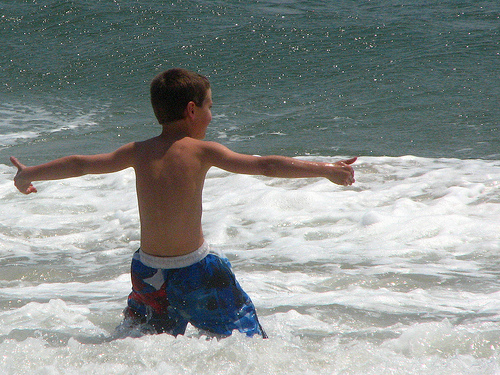

A young man in swim trunks is juggling in the beach .




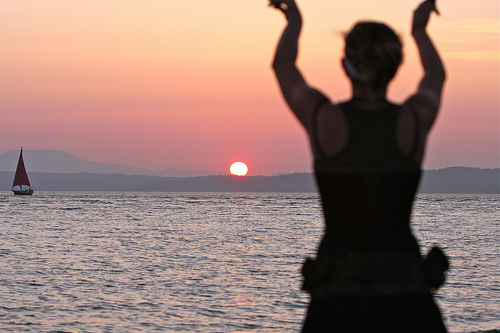

A woman walking on a line over a line to a line .




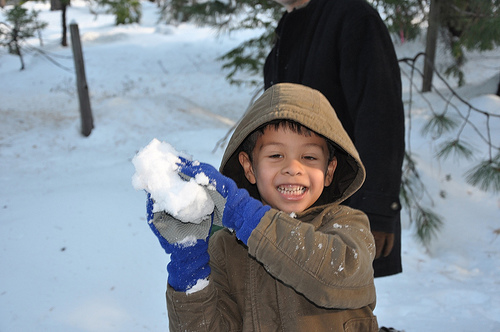

A man in a brown and a stands and glasses are wearing and a is are wearing and brown brown sign and a small sign of shop .




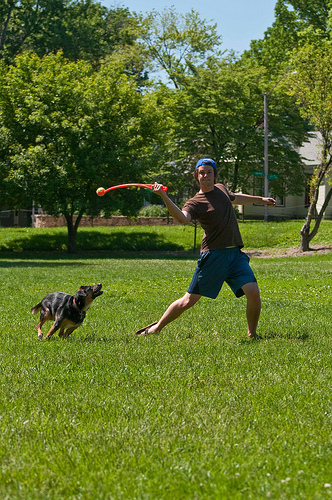

A boy is playing to a stick to catch a large toy .




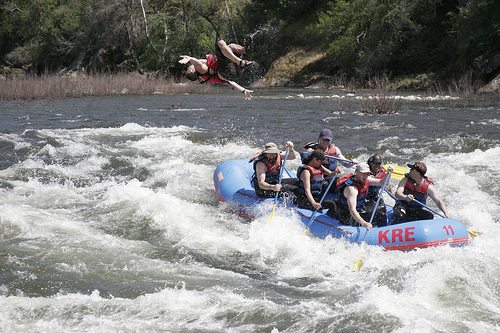

People are are sliding down a sand and sand .




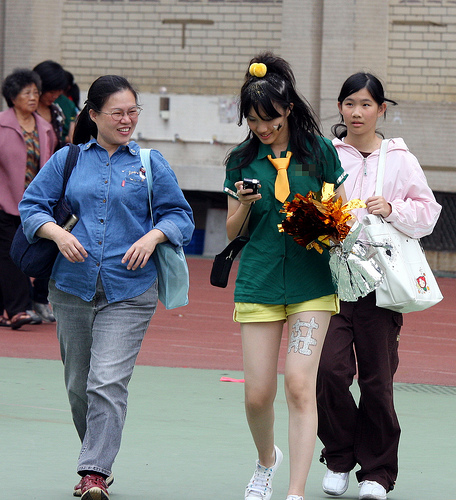

A group of young young girls are young boys a picture while flags to costume




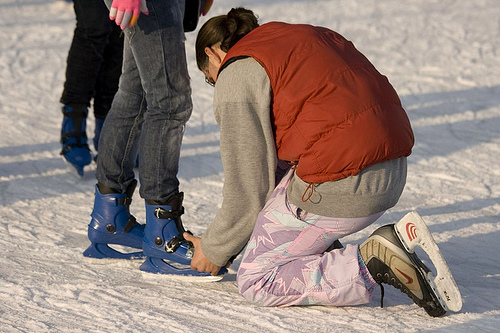

A boy wearing a shirt is and and is boy wearing white white hat and shirt and and and is is and and and is and holding picture her a arms up . . .




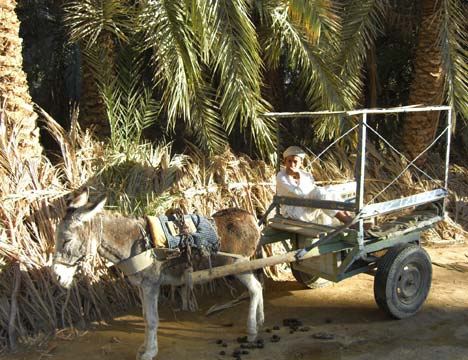

A couple sitting on a fence at a fence of left of a man at a bench .




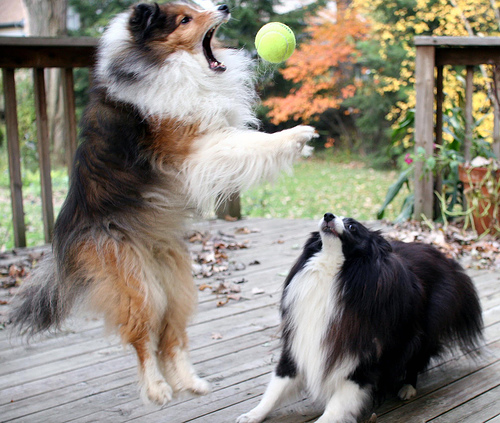

A white and white dog catches playing in its fast it .




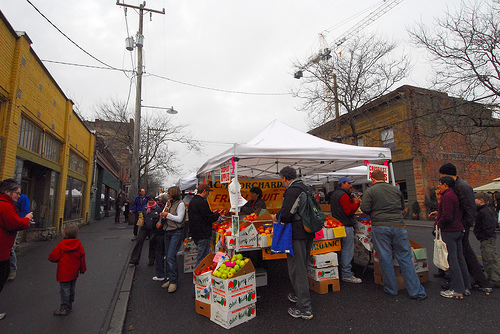

A group of men are walking on a crowd that are are are are are are are lot in the the other .




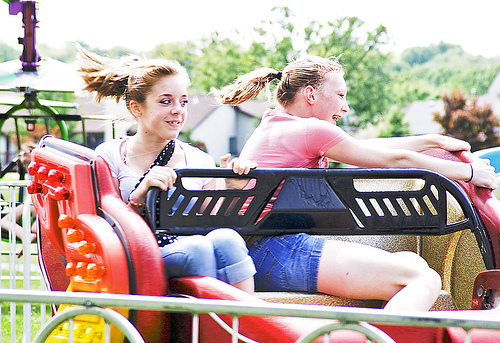

a woman in a red jacket is standing out in the mud with his street .




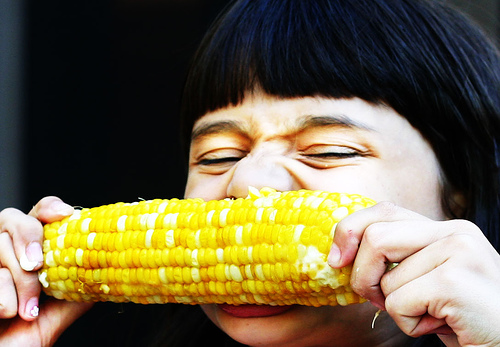

A little girl and girl jumping on a drink from a drinking .




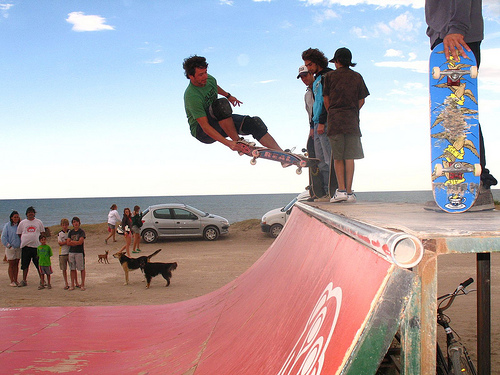

Two children ride a snowboard over a trampoline .




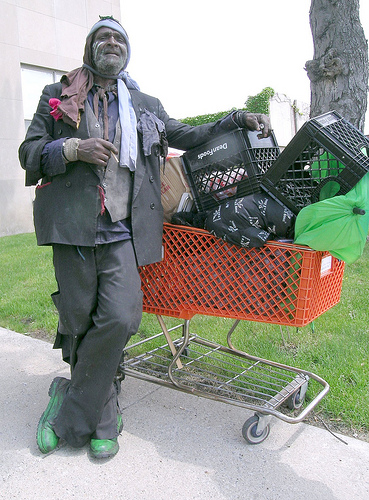

A woman in a red jacket and a standing over a tree in a crowd .




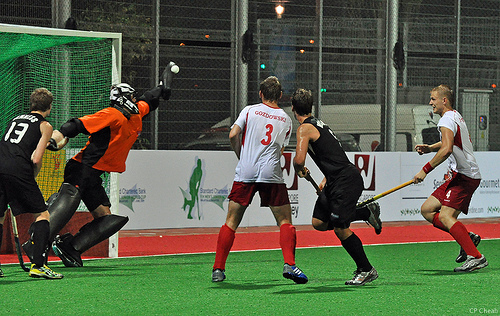

A group coach holding a game .




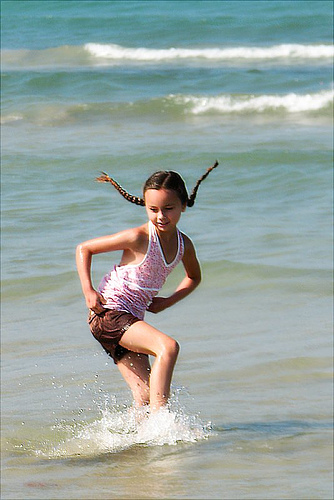

A boy is jumping over the grass of a large very grass .




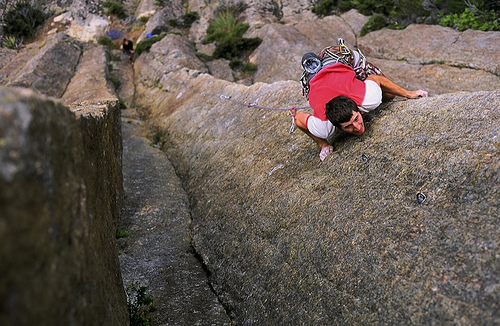

Two young Asian man in a headband man up a tire air .




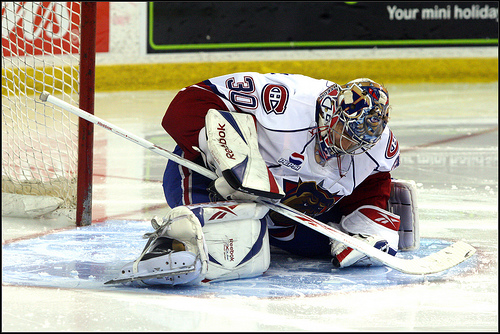

A hockey player knelt on the ice .




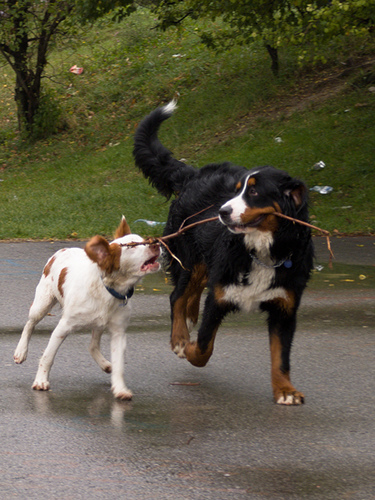

A brown dog and a black dog are on a large sandy two cows .




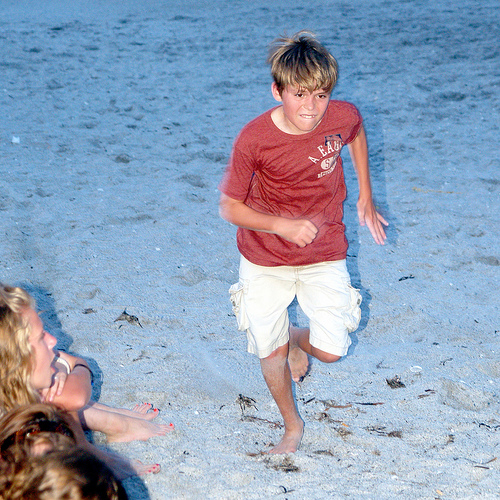

A dog is playing in the catch a large toy .




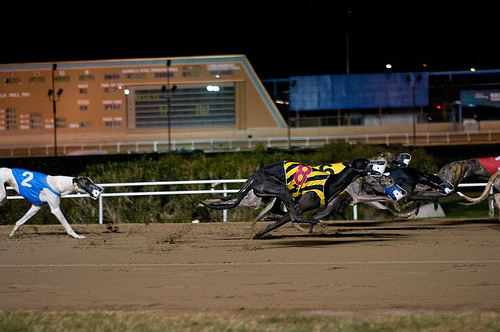

A boy is playing fast in the ball to catch a ball .




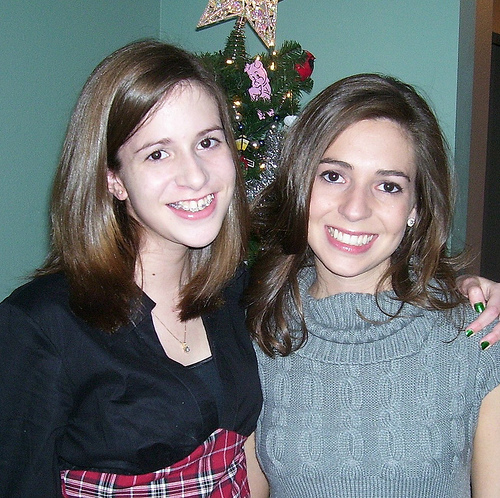

Two young adults smile door .




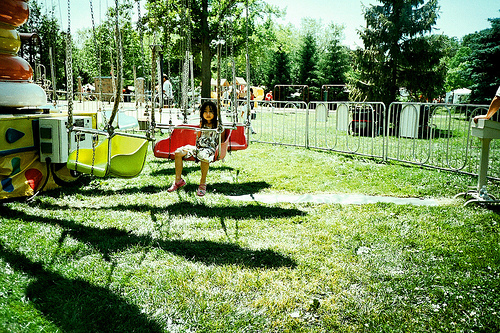

A boy is jumping over a tall large large large large large large large large large large large large large large large pilar from near . . . . . . . . . . . . . .




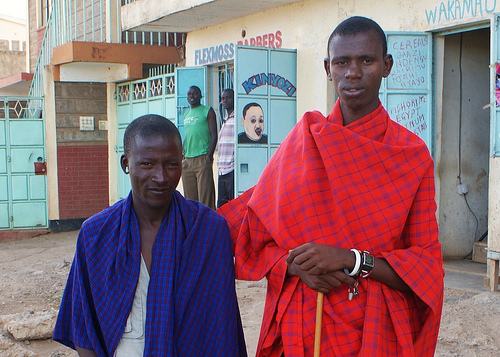

The women in the white dress at the woman is black .




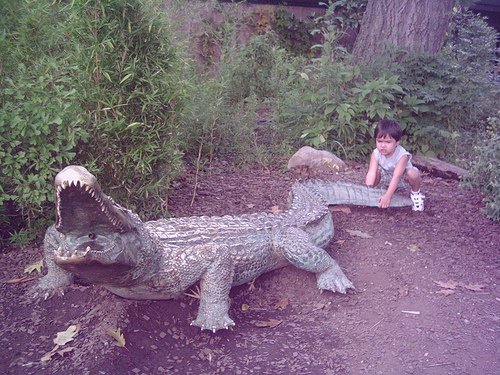

A dog and a dog stand to two stick to two stick




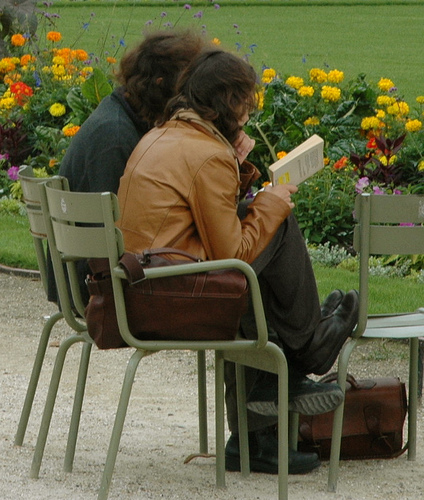

A man with a beard holding cellphone .




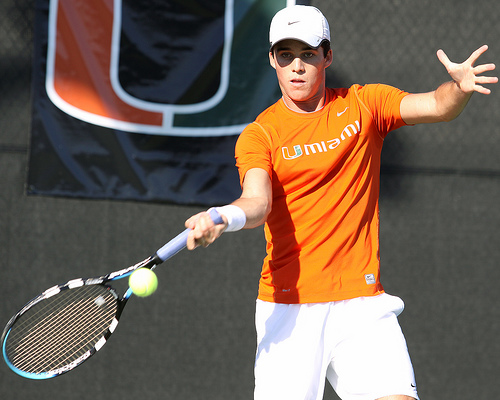

A man in a blue playing at the ball .




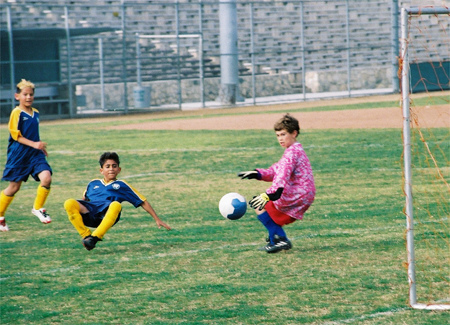

Two young man wearing red and playing on a field to grass , while baseball in the background




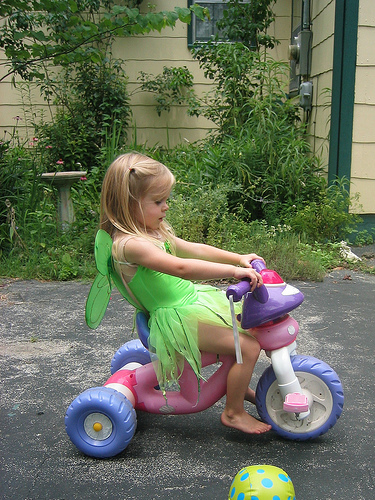

A small girl wearing a green fairy costume rides a tricycle .




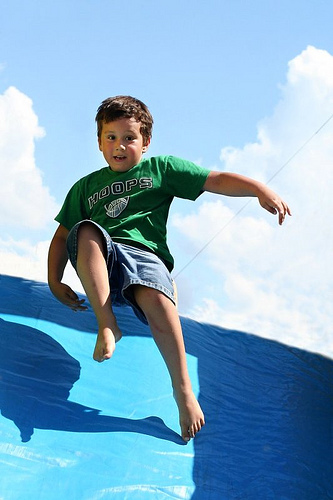

A man climbs a pink shirt and hanging on a yellow jacket shirt shirt and blue holding toy .




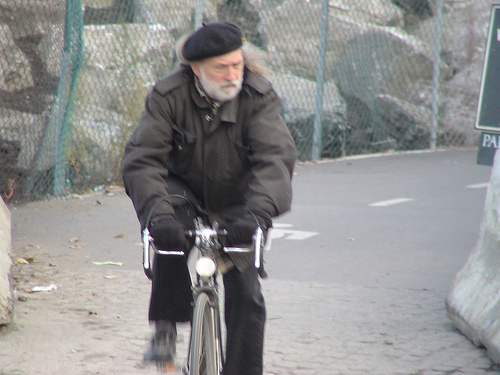

A man is is brown holding a back in the back in the grassy area .




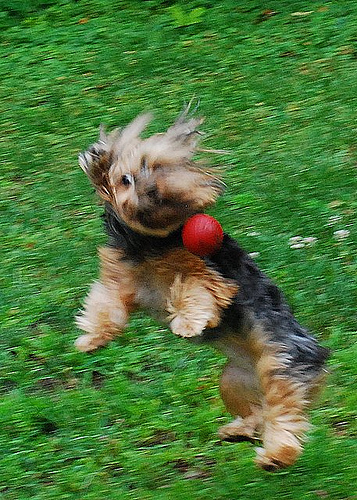

A woman is running catch to catch a red red ball in a field .




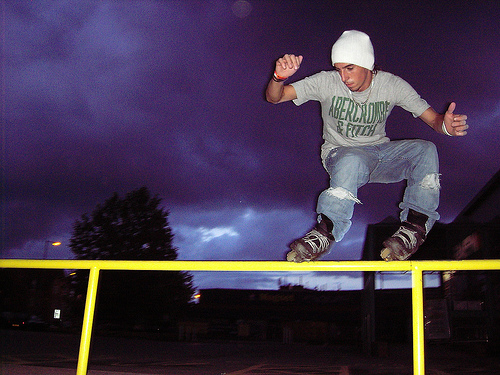

A man is kicks the base of a smoke the red clear in a field .




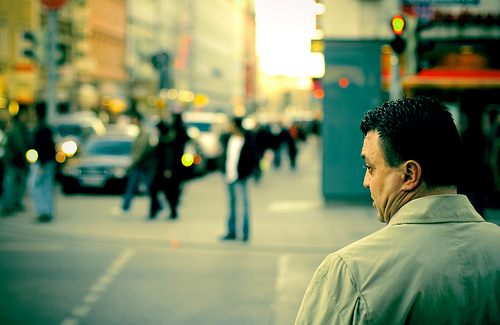

A man on a busy street .




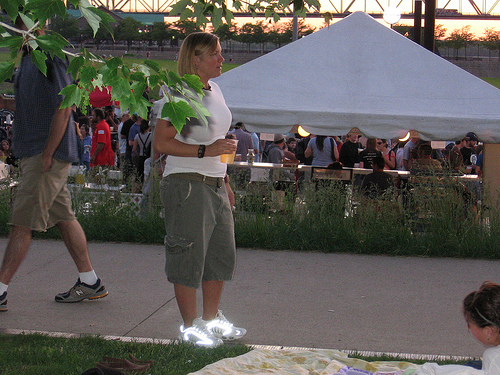

A man wearing an jacket stands on a city on a building .




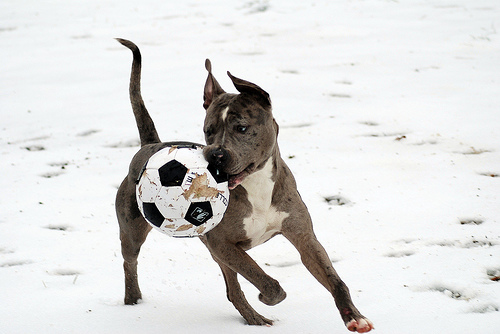

Two dogs are playing together on the snow .




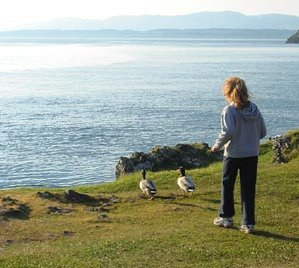

A small child in straw hat stands on top along a rock in front of front of a mountain with top .




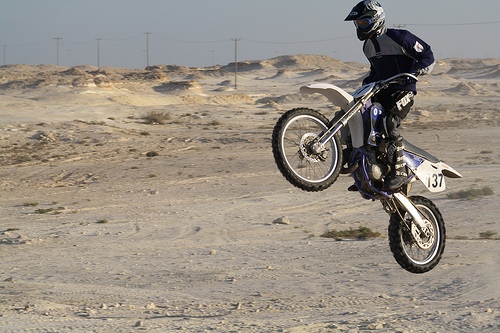

A man riding a bicycle through a bicycle while and bicycle on a rocky side .




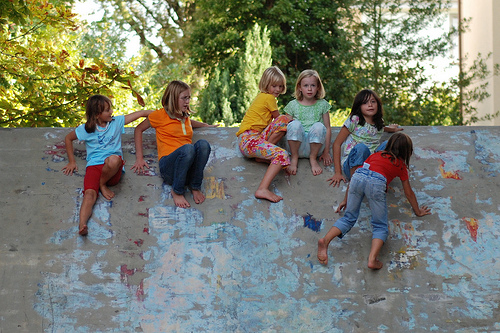

Four people walk on the beach .




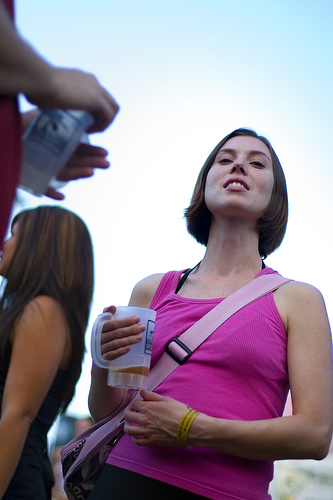

A woman in a pink white holding a baby and baby and baby and baby and a white and a baby and a baby and a baby .




In [ ]:
for i in range(50):
    # try:
    p=random.randrange(0,len(photo)+1)
    get_caption(photo[p])
    # except:
    #         pass